# Plotly tutorial

In [37]:
import pandas as pd
import numpy as np
#import chart_sudio.plotly as py
import seaborn as sns
import cufflinks as cf
import plotly.express as px
%matplotlib inline
import plotly.graph_objects as go

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot_mpl
init_notebook_mode(connected=True)
cf.go_offline()

Comparação com e sem plotly

In [38]:
arr_1 = np.random.rand(50,4)
df_1 = pd.DataFrame(arr_1, columns = ['a','b','c','d'])
df_1.head()

,a,b,c,d
0,0.509067,0.971484,0.670073,0.801237
1,0.621993,0.071417,0.363054,0.364068
2,0.867642,0.272586,0.557126,0.288515
3,0.876485,0.690480,0.362584,0.520976
4,0.569680,0.210589,0.720558,0.181019


<Axes: >

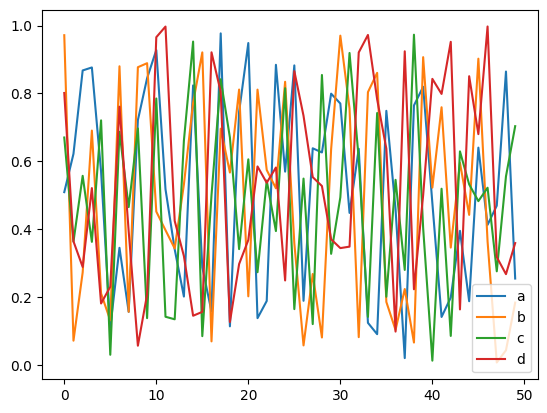

In [39]:
df_1.plot()

In [40]:
df_1.iplot()

## Gráficos de linha

In [41]:
df_acoes = px.data.stocks()
df_acoes.head()

,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


In [42]:
px.line(df_acoes, x='date', y = 'GOOG', labels = {'x': 'Date', 'y': 'Price'})

In [43]:
px.line(df_acoes, x='date', y = ['GOOG','AAPL'], labels = {'x': 'Date', 'y': 'Price'},
        title = 'Apple vs Google')

In [44]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_acoes.date, y=df_acoes.AAPL, mode='lines', name="Apple"))
fig.add_trace(go.Scatter(x=df_acoes.date, y=df_acoes.AMZN, mode='lines+markers', name="Amazon"))
fig.add_trace(go.Scatter(x=df_acoes.date, y=df_acoes.GOOG, mode='lines', name="Google",
                         line=dict(color='firebrick', width=2, dash='dashdot')))
# fig.update_layout(title='Stock Price', xaxis_title='Date', yaxis_title='Price')

fig.update_layout(
    xaxis=dict(
        showline=True, showgrid=False, showticklabels=True,
        linecolor='blue', linewidth=2, ticks='outside',
        tickfont=dict(family='Arial', size=12, color='red')
    ),
    yaxis=dict(
        showline=False, showgrid=False, showticklabels=False,
        zeroline=False, linecolor='blue', linewidth=2, ticks='outside',
        tickfont=dict(family='Arial', size=12, color='red'),
        automargin = True
    ),
)

fig.show()

In [45]:
df_br = px.data.gapminder().query("country == 'Brazil'")
df_br.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
168,Brazil,Americas,1952,50.917,56602560,2108.944355,BRA,76
169,Brazil,Americas,1957,53.285,65551171,2487.365989,BRA,76
170,Brazil,Americas,1962,55.665,76039390,3336.585802,BRA,76
171,Brazil,Americas,1967,57.632,88049823,3429.864357,BRA,76
172,Brazil,Americas,1972,59.504,100840058,4985.711467,BRA,76


## Gráfico de barra

In [46]:
px.bar(df_br, x = 'year', y = 'pop')

In [47]:
df_gorjetas = px.data.tips()
df_gorjetas.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [48]:
px.bar(df_gorjetas, x = 'day', y = 'tip', color = 'sex',
       title = 'Tips by sex',
       labels = {'tip':'Tip Amount', 'day':'week day'})

In [49]:
px.bar(df_gorjetas, x = 'sex', y = 'tip', color = 'smoker',
       barmode = 'group')

In [50]:
df_europa = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
df_europa.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
23,Albania,Europe,2007,76.423,3600523,5937.029526,ALB,8
83,Austria,Europe,2007,79.829,8199783,36126.492700,AUT,40
119,Belgium,Europe,2007,79.441,10392226,33692.605080,BEL,56
155,Bosnia and Herzegovina,Europe,2007,74.852,4552198,7446.298803,BIH,70
191,Bulgaria,Europe,2007,73.005,7322858,10680.792820,BGR,100


In [51]:
fig = px.bar(df_europa, y = 'pop', x = 'country',
             text = 'pop', color = 'country')
fig.update_traces(texttemplate = '%{text:.2s}', textposition = 'outside')
fig.update_layout(uniformtext_minsize = 8,
                  xaxis_tickangle = 45)
fig

## Gráfico de dispersão

In [52]:
df_iris = px.data.iris()
df_iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


In [53]:
px.scatter(df_iris, x = 'sepal_width', y = 'sepal_length', color = 'species',
           size = 'petal_length', hover_data = ['petal_width'])

In [54]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x = df_iris.sepal_width, y = df_iris.sepal_length,
    mode = 'markers', marker_color =df_iris.sepal_width,
    text = df_iris.species, marker = dict(showscale = True))
)
fig.update_traces(marker_line_width = 2, marker_size = 10)

In [55]:
fig = go.Figure(data = go.Scattergl(
    x = np.random.randn(100000),
    y = np.random.randn(100000),
    mode = 'markers',
    marker = dict(
        color = np.random.randn(100000),
        colorscale = 'Viridis',
        line_width = 1
    )
)
)
fig

## Gráfico de pizza

In [56]:
df_asia = px.data.gapminder().query("continent == 'Asia' and year == 2007")
df_asia.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
11,Afghanistan,Asia,2007,43.828,31889923,974.580338,AFG,4
95,Bahrain,Asia,2007,75.635,708573,29796.048340,BHR,48
107,Bangladesh,Asia,2007,64.062,150448339,1391.253792,BGD,50
227,Cambodia,Asia,2007,59.723,14131858,1713.778686,KHM,116
299,China,Asia,2007,72.961,1318683096,4959.114854,CHN,156


In [57]:
px.pie(df_asia, values = 'pop', names = 'country',
       title = 'Country population',
       color_discrete_sequence= px.colors.sequential.RdBu)

colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']


In [58]:
fig = go.Figure(data = go.Pie(labels = ['Water','Grass', 'Normal', 'Psychic', 'Fire', 'Groud'],
                              values = [110,90,80,120,70,50]))
fig.update_traces(hoverinfo = 'label+value', textfont_size = 12,
                  textinfo = 'label+percent', pull = [0.1,0,0,0.2,0,0],
                  marker = dict(colors = colors, 
                                line = dict(color = '#FFFFFF', width = 2)))


## Histograma

In [65]:
dado_1 = np.random.randint(1,7,5000)
dado_2 = np.random.randint(1,7,5000)
soma_dados = dado_1 + dado_2

fig = px.histogram(soma_dados, nbins = 11,
    labels = {'value': 'Soma dos dados'},
    title = 'Histograma 5000 lançamentos de dados',
    marginal = 'violin',
    color_discrete_sequence = ['green']
)

fig.update_layout(
    xaxis_title_text = 'Soma dos dados',
    yaxis_title_text = 'Número de Lançamentos',
    bargap = 0.1, showlegend = False
)

fig

In [66]:
px.histogram(df_gorjetas, x = 'total_bill', color = 'sex')

## Boxplots

In [67]:
px.box(df_gorjetas, x = 'sex', y = 'tip', points='all')

In [68]:
px.box(df_tips, x='day', y='tip', color ='sex')

In [70]:
fig = go.Figure()
fig.add_trace(go.Box(x = df_tips.sex, y = df_tips.tip,
    marker_color = 'blue', boxmean = 'sd')
)

In [86]:
fig = go.Figure()
fig.add_trace(go.Box(y = df_acoes.GOOG,
    boxpoints = 'all', fillcolor = 'blue', jitter = .5,
    whiskerwidth = .2, name = 'Google'))
fig.add_trace(go.Box(y = df_acoes.AAPL,
    boxpoints = 'all', fillcolor = 'red', jitter = .5,
    whiskerwidth = .2, name = 'Apple'))
fig.update_layout(title = 'google vs apple', plot_bgcolor = 'light grey',
    showlegend=False)

## Gráfico de violino